In [2]:
# !pip install scikit-learn

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score

In [4]:
df = pd.read_csv('cleaned_bank_data.csv')

In [5]:
df.head(10)

,Customer ID,full_name,Age,Gender,City,Account_Type,Account_Balance,Date_Of_Account_Opening,Last_Transaction_Date,Transaction_Amount,Loan_Status,Credit_Limit,Credit_Card_Balance,Last_Credit_Card_Payment_Date,Rewards_Points
0,1,Joshua_Hall,45,Male,Fort Worth,Current,1313.38,2006-05-26,2023-04-23,1457.61,Rejected,1737.88,4524.32,2023-03-20,8142
1,2,Mark_Taylor,47,Female,Louisville,Current,5988.46,2006-03-02,2023-01-27,1660.99,Approved,1799.36,856.70,2023-06-16,4306
2,3,Joseph_Flores,25,Female,Philadelphia,Current,8277.88,2015-07-19,2023-01-01,839.91,Closed,6112.96,3242.36,2023-03-20,4842
3,4,Kevin_Lee,52,Other,Oklahoma City,Savings,7487.21,2008-01-30,2023-08-02,4908.89,Approved,2069.41,4329.17,2023-10-15,9463
4,5,Linda_Johnson,68,Other,Phoenix,Savings,6993.55,2021-05-25,2023-03-27,589.07,Approved,2765.30,25.72,2023-07-27,2209
5,6,Charles_Torres,52,Male,El Paso,Savings,9295.64,2015-12-21,2023-06-04,4914.67,Closed,8029.18,1331.70,2023-11-16,478
6,7,Joshua_Garcia,43,Male,Dallas,Current,4005.72,2022-07-07,2023-03-21,3534.90,Approved,2996.82,1441.65,2023-10-09,5745
7,8,Christopher_Baker,47,Male,Memphis,Savings,1458.45,2022-12-14,2023-03-01,454.87,Approved,4470.78,3450.21,2023-07-18,5559
8,9,Daniel_Moore,52,Male,Indianapolis,Current,1109.30,2012-04-29,2023-11-05,768.56,Rejected,4349.57,3227.18,2023-09-25,4432
9,10,William_Robinson,55,Other,Washington,Current,9554.62,2021-12-20,2023-02-05,1641.59,Closed,4961.44,2765.38,2023-01-07,8226


In [6]:
date_cols = ['Date_Of_Account_Opening', 'Last_Transaction_Date', 'Last_Credit_Card_Payment_Date']
for col in date_cols:
    df[col] = pd.to_datetime(df[col], errors='coerce')

In [7]:
df.head(10)

,Customer ID,full_name,Age,Gender,City,Account_Type,Account_Balance,Date_Of_Account_Opening,Last_Transaction_Date,Transaction_Amount,Loan_Status,Credit_Limit,Credit_Card_Balance,Last_Credit_Card_Payment_Date,Rewards_Points
0,1,Joshua_Hall,45,Male,Fort Worth,Current,1313.38,2006-05-26,2023-04-23,1457.61,Rejected,1737.88,4524.32,2023-03-20,8142
1,2,Mark_Taylor,47,Female,Louisville,Current,5988.46,2006-03-02,2023-01-27,1660.99,Approved,1799.36,856.70,2023-06-16,4306
2,3,Joseph_Flores,25,Female,Philadelphia,Current,8277.88,2015-07-19,2023-01-01,839.91,Closed,6112.96,3242.36,2023-03-20,4842
3,4,Kevin_Lee,52,Other,Oklahoma City,Savings,7487.21,2008-01-30,2023-08-02,4908.89,Approved,2069.41,4329.17,2023-10-15,9463
4,5,Linda_Johnson,68,Other,Phoenix,Savings,6993.55,2021-05-25,2023-03-27,589.07,Approved,2765.30,25.72,2023-07-27,2209
5,6,Charles_Torres,52,Male,El Paso,Savings,9295.64,2015-12-21,2023-06-04,4914.67,Closed,8029.18,1331.70,2023-11-16,478
6,7,Joshua_Garcia,43,Male,Dallas,Current,4005.72,2022-07-07,2023-03-21,3534.90,Approved,2996.82,1441.65,2023-10-09,5745
7,8,Christopher_Baker,47,Male,Memphis,Savings,1458.45,2022-12-14,2023-03-01,454.87,Approved,4470.78,3450.21,2023-07-18,5559
8,9,Daniel_Moore,52,Male,Indianapolis,Current,1109.30,2012-04-29,2023-11-05,768.56,Rejected,4349.57,3227.18,2023-09-25,4432
9,10,William_Robinson,55,Other,Washington,Current,9554.62,2021-12-20,2023-02-05,1641.59,Closed,4961.44,2765.38,2023-01-07,8226


In [8]:
# Compute days since account opening to last transaction
df['Account_Age_Days'] = (df['Last_Transaction_Date'] - df['Date_Of_Account_Opening']).dt.days


In [9]:
df_clean = df.drop(['Customer ID', 'full_name', 'City', 'Date_Of_Account_Opening', 
                    'Last_Transaction_Date', 'Last_Credit_Card_Payment_Date'], axis=1)

In [10]:
df_encoded = pd.get_dummies(df_clean, columns=['Gender', 'Account_Type', 'Loan_Status'], drop_first=True)

In [11]:
df_encoded = df_encoded.fillna(df_encoded.median())

In [12]:
df_encoded.head(10)

,Age,Account_Balance,Transaction_Amount,Credit_Limit,Credit_Card_Balance,Rewards_Points,Account_Age_Days,Gender_Male,Gender_Other,Account_Type_Savings,Loan_Status_Closed,Loan_Status_Rejected
0,45,1313.38,1457.61,1737.88,4524.32,8142,6176,True,False,False,False,True
1,47,5988.46,1660.99,1799.36,856.70,4306,6175,False,False,False,False,False
2,25,8277.88,839.91,6112.96,3242.36,4842,2723,False,False,False,True,False
3,52,7487.21,4908.89,2069.41,4329.17,9463,5663,False,True,True,False,False
4,68,6993.55,589.07,2765.30,25.72,2209,671,False,True,True,False,False
5,52,9295.64,4914.67,8029.18,1331.70,478,2722,True,False,True,True,False
6,43,4005.72,3534.90,2996.82,1441.65,5745,257,True,False,False,False,False
7,47,1458.45,454.87,4470.78,3450.21,5559,77,True,False,True,False,False
8,52,1109.30,768.56,4349.57,3227.18,4432,4207,True,False,False,False,True
9,55,9554.62,1641.59,4961.44,2765.38,8226,412,False,True,False,True,False


In [13]:
features = ['Age', 'Account_Balance', 'Transaction_Amount', 'Credit_Limit', 
            'Credit_Card_Balance', 'Rewards_Points', 'Account_Age_Days'] + \
           [col for col in df_encoded.columns if col.startswith('Gender_') or 
            col.startswith('Account_Type_') or col.startswith('Loan_Status_')]

In [14]:
df_encoded.describe()

,Age,Account_Balance,Transaction_Amount,Credit_Limit,Credit_Card_Balance,Rewards_Points,Account_Age_Days
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.0000
mean,43.469800,5060.570918,2508.501144,5549.035830,2487.40084,4966.161800,4383.4394
std,15.145672,2849.356481,1450.194986,2581.718105,1446.80295,2901.410915,2430.4583
min,18.000000,107.200000,10.570000,1007.000000,1.45000,1.000000,40.0000
25%,30.000000,2582.777500,1241.150000,3314.065000,1243.51750,2475.250000,2308.7500
50%,43.000000,5075.500000,2494.025000,5567.485000,2461.62000,4950.500000,4308.0000
75%,57.000000,7509.760000,3796.222500,7786.040000,3722.58000,7483.250000,6527.2500
max,69.000000,9998.110000,4998.390000,9997.780000,4997.11000,9999.000000,8748.0000


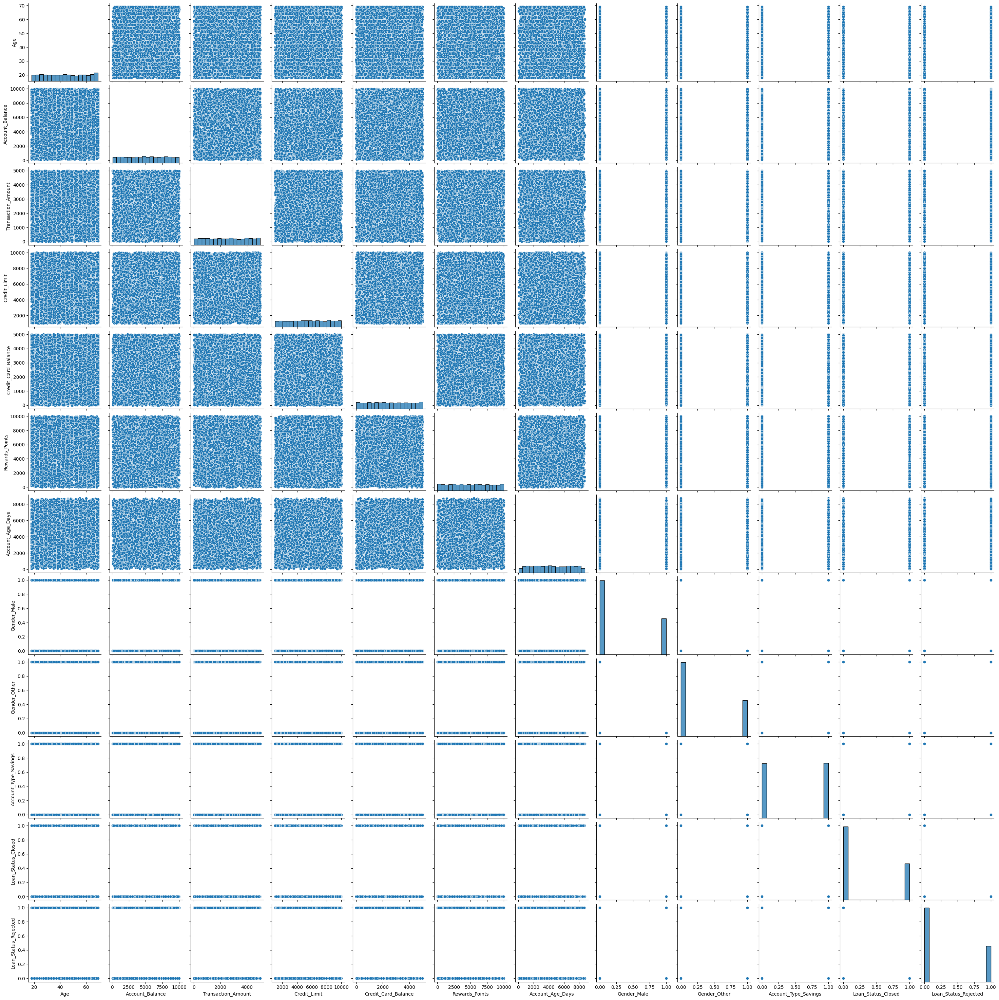

In [15]:
sns.pairplot(df_encoded)
plt.show()

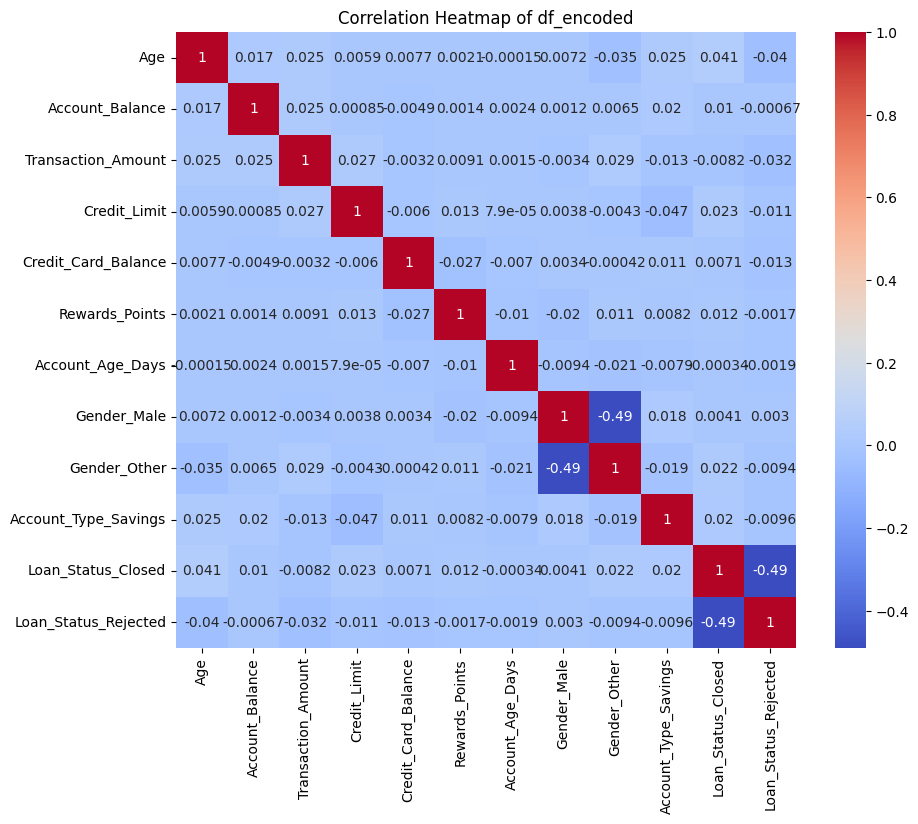

In [16]:
plt.figure(figsize=(10, 8))
sns.heatmap(df_encoded.corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap of df_encoded")
plt.show()

In [17]:
X = df_encoded[features]

In [18]:
X

,Age,Account_Balance,Transaction_Amount,Credit_Limit,Credit_Card_Balance,Rewards_Points,Account_Age_Days,Gender_Male,Gender_Other,Account_Type_Savings,Loan_Status_Closed,Loan_Status_Rejected
0,45,1313.38,1457.61,1737.88,4524.32,8142,6176,True,False,False,False,True
1,47,5988.46,1660.99,1799.36,856.70,4306,6175,False,False,False,False,False
2,25,8277.88,839.91,6112.96,3242.36,4842,2723,False,False,False,True,False
3,52,7487.21,4908.89,2069.41,4329.17,9463,5663,False,True,True,False,False
4,68,6993.55,589.07,2765.30,25.72,2209,671,False,True,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,21,5564.12,1612.91,4347.17,2017.13,7530,1219,False,True,True,False,True
4996,27,2625.13,2493.45,8379.59,853.33,8796,4324,False,False,True,True,False
4997,45,2732.76,418.38,8208.84,228.49,9966,4115,False,False,False,False,True
4998,58,3006.01,3160.96,3083.35,325.37,538,8403,False,False,False,False,True


In [19]:
X.columns

Index(['Age', 'Account_Balance', 'Transaction_Amount', 'Credit_Limit',
       'Credit_Card_Balance', 'Rewards_Points', 'Account_Age_Days',
       'Gender_Male', 'Gender_Other', 'Account_Type_Savings',
       'Loan_Status_Closed', 'Loan_Status_Rejected'],
      dtype='object')

In [20]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

Clustering algorithms (like K-Means) rely on distance calculations, so features with different scales (e.g., Account Balance vs. Age) can distort the results. To address this, we can scale the features.

Before Scaling:

    Age: [25, 45, 52, 68]
    Account Balance: [1109, 5998, 9554, 8277]

After Scaling:

    Age: [-1.1, 0.2, 0.8, 1.5]
    Account Balance: [-1.3, -0.4, 1.4, 0.5]

In [21]:
X_scaled

array([[ 0.10104227, -1.31523231, -0.72472754, ..., -1.00280393,
        -0.70498652,  1.43787505],
       [ 0.23310641,  0.32568122, -0.58447031, ..., -1.00280393,
        -0.70498652, -0.69547072],
       [-1.21959909,  1.12924826, -1.15071287, ..., -1.00280393,
         1.41846685, -0.69547072],
       ...,
       [ 0.10104227, -0.81704194, -1.44141319, ..., -1.00280393,
        -0.70498652,  1.43787505],
       [ 0.95945916, -0.7211335 ,  0.44995612, ..., -1.00280393,
        -0.70498652,  1.43787505],
       [-0.55927841,  0.68879249, -1.53591339, ..., -1.00280393,
        -0.70498652,  1.43787505]], shape=(5000, 12))

c:\Users\ADMIN\Documents\HP\old ssd\MY FILES\projects\New folder\clustering-algorithms\simple_ml_env\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Users\ADMIN\Documents\HP\old ssd\MY FILES\projects\New folder\clustering-algorithms\simple_ml_env\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
        "wmic CPU Get NumberOfCores /Format:csv".split(),
        capture_output=True,
        text=True,
    )
  File "C:\Program Files\WindowsApps\PythonSoftwareFoundation.Python.3.13_3.13.752.0_x64__qbz5n2kfra8p0\Lib\subprocess.py", line 556, in run
    with Popen(*popenargs, **kwargs) as proce

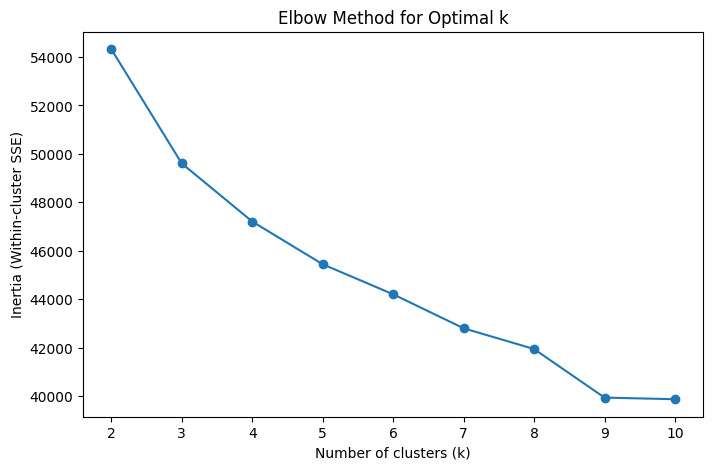

In [22]:
inertias = []
K = range(2, 11)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(K, inertias, marker='o')
plt.xlabel("Number of clusters (k)")
plt.ylabel("Inertia (Within-cluster SSE)")
plt.title("Elbow Method for Optimal k")
plt.show()

Each clustering metric provides a different perspective on the quality of clusters:  

1. **Silhouette Score (Higher is Better)**  
   - Measures how well-separated the clusters are.  
   - Values range from \(-1\) to \(1\):  
     - Close to \(1\): Well-defined clusters.  
     - Near \(0\): Overlapping clusters.  
     - Negative: Incorrect clustering.  
   - **Use case**: Evaluates cluster cohesion and separation.  

2. **Calinski-Harabasz Index (Higher is Better)**  
   - Ratio of intra-cluster dispersion to inter-cluster dispersion.  
   - Higher values indicate well-separated and compact clusters.  
   - **Use case**: Good for selecting the optimal number of clusters.  

3. **Davies-Bouldin Index (Lower is Better)**  
   - Measures the average similarity between clusters.  
   - Lower values indicate **compact** and **well-separated** clusters.  
   - **Use case**: Evaluates cluster compactness and separation balance.  

For **banking customer segmentation**, a lower **Davies-Bouldin Index** and a higher **Calinski-Harabasz Index** are often preferred, as they ensure distinct and meaningful customer groups.

In [23]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

results = []
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_scaled)
    
    sil = silhouette_score(X_scaled, labels)
    ch = calinski_harabasz_score(X_scaled, labels)
    db = davies_bouldin_score(X_scaled, labels)
    
    results.append({
        'k': k,
        'Silhouette Score': sil,
        'Calinski-Harabasz': ch,
        'Davies-Bouldin': db
    })

results_df = pd.DataFrame(results)
print("Evaluation Metrics for Different k:")
display(results_df)

Evaluation Metrics for Different k:


,k,Silhouette Score,Calinski-Harabasz,Davies-Bouldin
0,2,0.095244,522.153615,3.048962
1,3,0.105856,523.627742,2.571794
2,4,0.096037,451.354382,2.612674
3,5,0.098533,400.134229,2.613812
4,6,0.091873,357.087697,2.569566
5,7,0.098411,334.544608,2.745420
6,8,0.086884,307.156874,2.558143
7,9,0.122118,313.560267,2.622600
8,10,0.102001,280.064738,2.652463


Silhouette Score (higher is better) measures how well clusters are separated. The highest value is at k=9.
Calinski-Harabasz Index (higher is better) evaluates cluster compactness and separation. The highest value is at k=3.
Davies-Bouldin Index (lower is better) assesses cluster compactness and similarity. The lowest value is at k=8.

Text(0, 0.5, 'Principal Component 2')

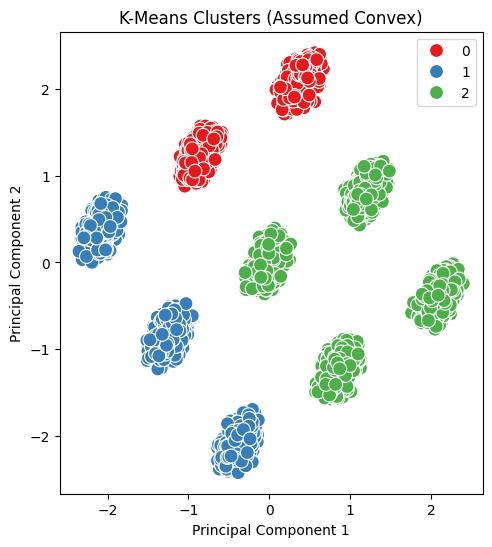

In [37]:
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from scipy.spatial import ConvexHull

# Reduce data to 2D using PCA
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# Run K-Means with the best k from elbow/multiple metric analysis (adjust k as needed; here we use k=3 as an example)
best_k = 3
kmeans = KMeans(n_clusters=best_k, random_state=42)
kmeans_labels = kmeans.fit_predict(X_scaled)

# Plot K-Means clusters with convex hulls
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=kmeans_labels, palette='Set1', s=100)
plt.title("K-Means Clusters (Assumed Convex)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")

PCA (Principal Component Analysis) selects data based on a mathematical process that finds the directions of maximum variance in your dataset. Here's how it works:

1. **PC1 (First Principal Component)**:
   - PCA first looks for the direction (vector) that captures the most variance in your data
   - It does this by calculating eigenvectors and eigenvalues of the covariance matrix
   - The eigenvector with the highest eigenvalue becomes PC1
   - In your case, it found that `Loan_Status_Closed` (0.578) and `Loan_Status_Rejected` (-0.577) contribute the most to PC1

2. **PC2 (Second Principal Component)**:
   - After finding PC1, PCA looks for the next direction that:
     - Captures the second most variance
     - Is perpendicular (orthogonal) to PC1
   - In your data, `Gender_Male` (0.582) and `Gender_Other` (-0.573) have the strongest influence on PC2

The selection process is automatic and based on:
1. Maximizing variance explained
2. Ensuring components are orthogonal
3. Maintaining the most important patterns in your data while reducing dimensions

The weights (coefficients) you see for each feature represent how much they contribute to each principal component, determined by this mathematical optimization process.

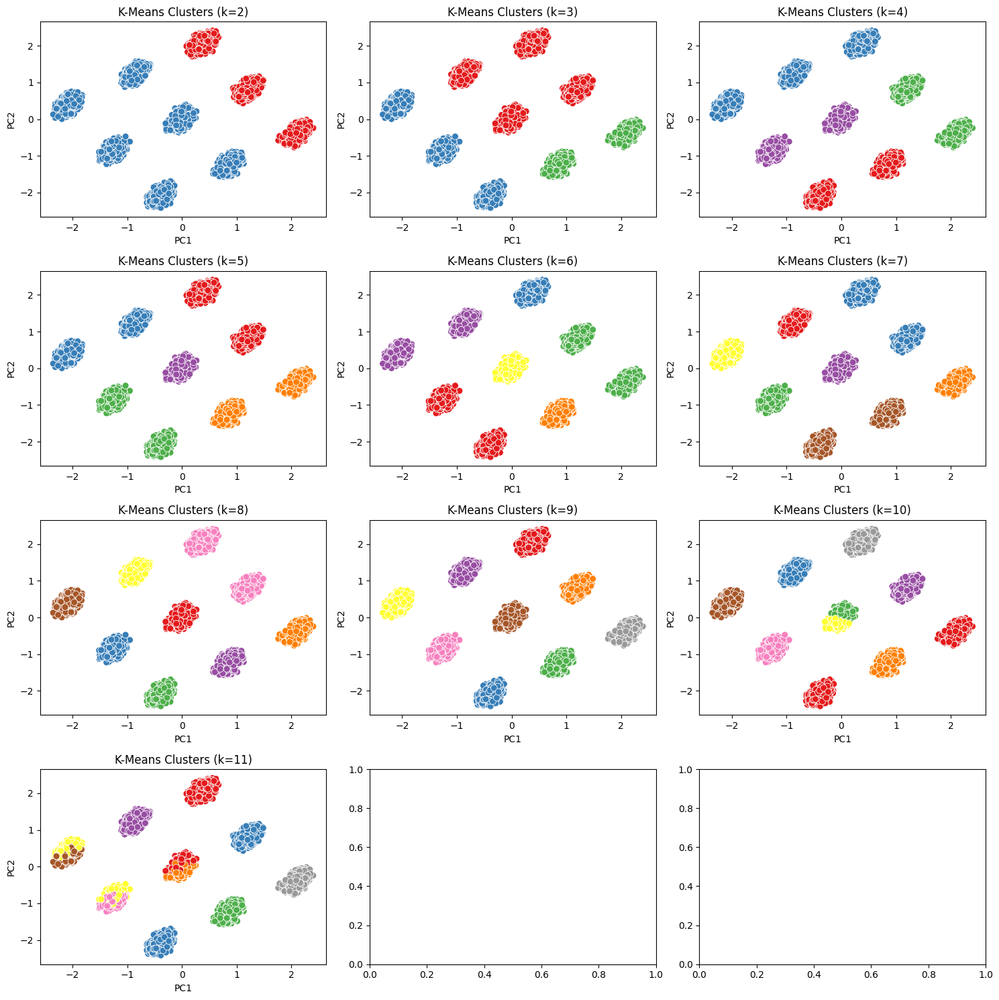

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Reduce data to 2D using PCA
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# Define k values
k_values = range(2, 12)

# Set up the grid layout (4 rows, 3 columns)
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 15))
axes = axes.flatten()

# Loop through different k values
for i, k in enumerate(k_values):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_scaled)
    
    # Plot each k-means clustering result
    ax = axes[i]
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=labels, palette='Set1', s=50, ax=ax)
    ax.set_title(f"K-Means Clusters (k={k})")
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.legend([], [], frameon=False)  # Hide legends for clarity

# Adjust layout
plt.tight_layout()
plt.show()


In [35]:
# Create a DataFrame with feature names and their contributions to PC1 and PC2
components_df = pd.DataFrame(
    pca.components_.T,
    columns=['PC1', 'PC2'],
    index=X.columns
)

# Sort and display the most influential features for each component
print("\nTop features contributing to PC1:")
print(components_df['PC1'].sort_values(ascending=False))

print("\nTop features contributing to PC2:")
print(components_df['PC2'].sort_values(ascending=False))


Top features contributing to PC1:
Loan_Status_Closed      0.578370
Gender_Other            0.410141
Age                     0.062459
Transaction_Amount      0.059223
Rewards_Points          0.041615
Credit_Limit            0.035967
Account_Balance         0.021909
Credit_Card_Balance     0.018277
Account_Type_Savings    0.004896
Account_Age_Days       -0.008494
Gender_Male            -0.391166
Loan_Status_Rejected   -0.576990
Name: PC1, dtype: float64

Top features contributing to PC2:
Gender_Male             0.582294
Loan_Status_Closed      0.392943
Age                     0.120300
Account_Type_Savings    0.072446
Credit_Limit            0.029564
Credit_Card_Balance     0.025629
Account_Age_Days        0.013155
Account_Balance         0.008974
Transaction_Amount     -0.013462
Rewards_Points         -0.024798
Loan_Status_Rejected   -0.394891
Gender_Other           -0.572966
Name: PC2, dtype: float64


some features appear to be "repeated" or show strong opposite correlations because they represent binary categorical variables that are one-hot encoded. Let me explain the patterns:

1. **Gender variables**:
   - `Gender_Male` and `Gender_Other` show opposite relationships
   - In PC1: Gender_Other (0.410) vs Gender_Male (-0.391)
   - In PC2: Gender_Male (0.582) vs Gender_Other (-0.573)
   - This is expected because they're mutually exclusive binary indicators

2. **Loan Status variables**:
   - `Loan_Status_Closed` and `Loan_Status_Rejected` also show opposite relationships
   - In PC1: Loan_Status_Closed (0.578) vs Loan_Status_Rejected (-0.577)
   - In PC2: Loan_Status_Closed (0.393) vs Loan_Status_Rejected (-0.395)
   - Again, these are mutually exclusive categories

This pattern occurs because of one-hot encoding:
- When you have a categorical variable with n categories, it's converted into n-1 binary columns
- These columns are naturally negatively correlated because they represent mutually exclusive states
- When one is 1, the others must be 0

For example, for Gender:
- If Gender_Male = 1, then Gender_Other must be 0
- If Gender_Other = 1, then Gender_Male must be 0

This explains why you see these features with similar magnitudes but opposite signs in both principal components. It's not actually repetition, but rather the mathematical relationship between one-hot encoded categorical variables.

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_23988\3314736541.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Cluster")


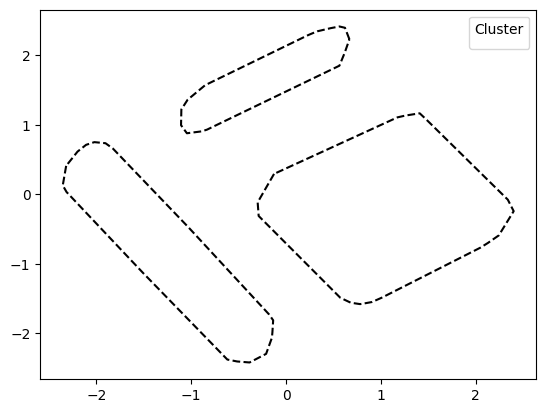

In [26]:
# Overlay convex hulls for each cluster
for cluster in np.unique(kmeans_labels):
    points = X_pca[kmeans_labels == cluster]
    if len(points) >= 3:  # Convex hull needs at least 3 points
        hull = ConvexHull(points)
        hull_points = points[hull.vertices]
        # Close the hull by appending the first point at the end
        hull_points = np.concatenate([hull_points, hull_points[0:1]], axis=0)
        plt.plot(hull_points[:, 0], hull_points[:, 1], 'k--', lw=1.5)
plt.legend(title="Cluster")

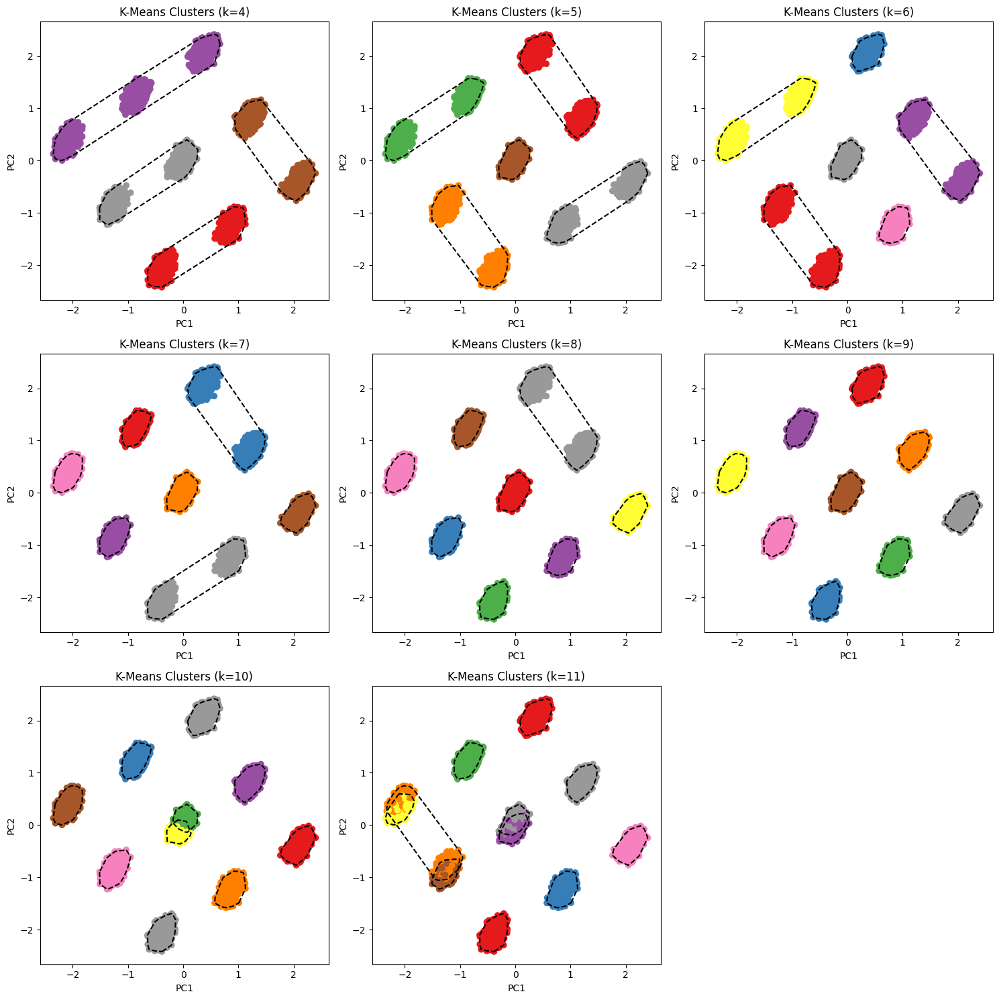

In [27]:
# Set up the subplot grid
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.flatten()

# Try different k values
for idx, k in enumerate(range(4, 12)):
    # Apply k-means clustering
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_scaled)
    
    # Plot on corresponding subplot
    ax = axes[idx]
    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='Set1')
    
    # Add convex hulls
    for cluster in range(k):
        points = X_pca[labels == cluster]
        if len(points) >= 3:
            hull = ConvexHull(points)
            hull_points = points[hull.vertices]
            hull_points = np.concatenate([hull_points, hull_points[0:1]], axis=0)
            ax.plot(hull_points[:, 0], hull_points[:, 1], 'k--', lw=1.5)
    
    ax.set_title(f'K-Means Clusters (k={k})')
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')

# Remove the empty subplot
axes[-1].remove()

# Adjust layout
plt.tight_layout()
plt.show()

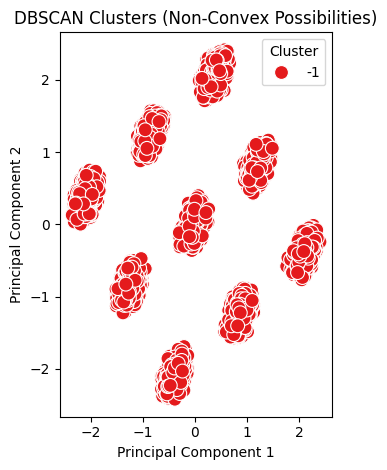

In [28]:
dbscan = DBSCAN(eps=1.5, min_samples=11)
dbscan_labels = dbscan.fit_predict(X_scaled)

plt.subplot(1, 2, 2)
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=dbscan_labels, palette='Set1', s=100)
plt.title("DBSCAN Clusters (Non-Convex Possibilities)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster")
plt.tight_layout()
plt.show()

Number of clusters for each eps and min_samples combination:
eps=0.5, min_samples=1 -> 4994 clusters
eps=0.5, min_samples=2 -> 6 clusters
eps=0.5, min_samples=3 -> 0 clusters
eps=0.5, min_samples=4 -> 0 clusters
eps=0.5, min_samples=5 -> 0 clusters
eps=0.5, min_samples=6 -> 0 clusters
eps=0.5, min_samples=7 -> 0 clusters
eps=0.5, min_samples=8 -> 0 clusters
eps=0.5, min_samples=9 -> 0 clusters
eps=0.5, min_samples=10 -> 0 clusters
eps=1.0, min_samples=1 -> 4713 clusters
eps=1.0, min_samples=2 -> 256 clusters
eps=1.0, min_samples=3 -> 26 clusters
eps=1.0, min_samples=4 -> 3 clusters
eps=1.0, min_samples=5 -> 0 clusters
eps=1.0, min_samples=6 -> 0 clusters
eps=1.0, min_samples=7 -> 0 clusters
eps=1.0, min_samples=8 -> 0 clusters
eps=1.0, min_samples=9 -> 0 clusters
eps=1.0, min_samples=10 -> 0 clusters
eps=1.5, min_samples=1 -> 1921 clusters
eps=1.5, min_samples=2 -> 560 clusters
eps=1.5, min_samples=3 -> 269 clusters
eps=1.5, min_samples=4 -> 217 clusters
eps=1.5, min_samples=5 -> 157 c

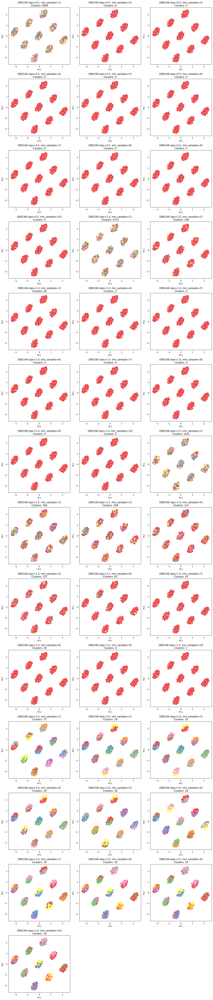

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN

# Reduce data to 2D using PCA
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# Define a range of eps and min_samples values
eps_values = [0.5, 1.0, 1.5, 2.0]
min_samples_values = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

# Create a grid for subplots with 3 columns
rows = len(eps_values) * len(min_samples_values) // 3 + (len(eps_values) * len(min_samples_values) % 3 > 0)
fig, axes = plt.subplots(nrows=rows, ncols=3, figsize=(15, rows * 5))
axes = axes.flatten()

# Iterate through different eps and min_samples combinations
plot_idx = 0
for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X_scaled)

        # Count the number of clusters (exclude -1, which represents noise)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)  # Exclude noise (-1)
        
        # Plot DBSCAN results
        ax = axes[plot_idx]
        sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=labels, palette='Set1', s=50, ax=ax)
        ax.set_title(f"DBSCAN (eps={eps}, min_samples={min_samples})\nClusters: {n_clusters}")
        ax.set_xlabel("PC1")
        ax.set_ylabel("PC2")
        ax.legend([], [], frameon=False)  # Hide legend for clarity
        plot_idx += 1

# Remove any unused subplots
for i in range(plot_idx, len(axes)):
    fig.delaxes(axes[i])

# Adjust layout
plt.tight_layout()

# Print the number of clusters formed for each eps and min_samples combination
print("Number of clusters for each eps and min_samples combination:")
for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X_scaled)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        print(f"eps={eps}, min_samples={min_samples} -> {n_clusters} clusters")

plt.show()


### **DBSCAN Parameters Explanation:**

1. **`eps` (epsilon)**: 
   - This defines the maximum distance between two points for them to be considered as part of the same neighborhood. 
   - A small `eps` value means that only points that are very close to each other will be clustered together. 
   - A larger `eps` value will allow for a larger neighborhood, meaning more points can be grouped together into the same cluster.
   - **Smaller `eps` values** lead to more clusters (potentially noise), while **larger `eps` values** group points into fewer clusters.

2. **`min_samples`**: 
   - This is the minimum number of points required to form a dense region (a cluster).
   - If a neighborhood of a point contains fewer than `min_samples` points, it is considered noise.
   - **Lower `min_samples` values** make it easier for points to be grouped into a cluster, leading to a higher number of smaller clusters or noise points. 
   - **Higher `min_samples` values** require a denser region for a cluster, which typically reduces the number of clusters but may yield more robust and larger clusters.

---

### **Interpreting the Results:**

Looking at the results, here’s the key observation:

- **Small `eps` (e.g., 0.5) with `min_samples=1`** results in **4994 clusters**, which means that the algorithm treats almost every point as its own cluster, likely because the points are considered isolated due to the very small neighborhood (`eps=0.5`).
  
- **Larger `eps` values (e.g., 1.0, 1.5, and 2.0)** combined with **higher `min_samples` values** lead to a decrease in the number of clusters, because fewer points meet the density requirement (i.e., having `min_samples` within `eps`).

---

### **Choosing the Right `eps` and `min_samples`:**

- **`eps=1.0` and `min_samples=2` or `min_samples=3`** seem like a reasonable choice for a balance between identifying meaningful clusters and avoiding an overwhelming number of small, isolated clusters. These settings give **several hundred to a few thousand clusters**, which is often ideal for datasets where you're looking for a moderate level of granularity in clusters.

- **`eps=2.0` and `min_samples=10`** result in **18 clusters**, suggesting that this setting is very permissive in forming large clusters. This might be useful for identifying broader, more general patterns, especially if the data is highly sparse.

---

### **Suggestions:**

- If you're seeing **too many or too few clusters**, it likely means that your `eps` or `min_samples` values are not appropriately tuned for the data's density.
  - **Too many clusters**: This often happens with a low `eps` (like 0.5) or very low `min_samples`, as you're defining each point as its own cluster.
  - **Too few clusters**: This can occur if `eps` is too large or if `min_samples` is too high, grouping too many points into one cluster.
  
- Based on your results:
  - **`eps=1.0` and `min_samples=2` or `min_samples=3`** would likely be a good starting point, as they offer a balanced number of clusters and clear separation.
  - You may want to **increase `eps` slightly** or **adjust `min_samples`** based on the expected cluster density in your dataset.

---

### **To Summarize:**
For your case, it seems that `eps=1.0` combined with a small value for `min_samples` (like 2 or 3) will provide a good balance between finding significant clusters and avoiding noise. As the `min_samples` value increases, the number of clusters decreases, and you may miss smaller, potentially interesting clusters. The key is to adjust based on the **expected density** of the clusters you want to capture.

cluster -1 indicates outliers
Avoid min_samples=1: It almost always leads to overfitting.


Cluster Profiles:
                  Age        Account_Balance          Transaction_Amount  \
                 mean    std            mean      std               mean   
DBSCAN_Cluster                                                             
-1              45.93  17.34         5105.76  3524.34            2474.81   
 0              42.93  14.80         4797.55  2847.29            2442.36   
 1              42.37  15.33         4840.12  2883.03            2553.64   
 2              44.44  15.41         4806.04  2813.35            2593.06   
 3              43.29  15.78         5076.05  2815.12            2748.20   
 4              44.22  14.84         5383.38  2844.08            2450.28   
 5              44.00  14.81         5048.70  2881.57            2686.09   
 6              43.95  14.85         5067.15  2892.96            2586.59   
 7              41.72  14.80         5150.48  2785.19            2413.86   
 8              45.14  15.06         5009.79  2743.42            2378

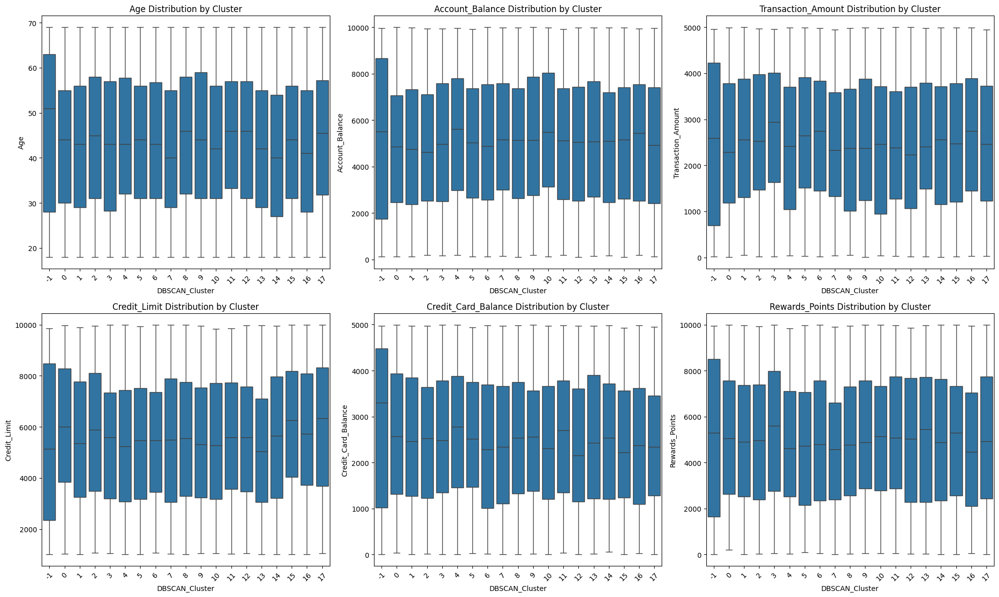


Gender Distribution in Each Cluster:
Gender          Female   Male  Other
DBSCAN_Cluster                      
-1                31.7   33.7   34.6
 0                 NaN  100.0    NaN
 1               100.0    NaN    NaN
 2               100.0    NaN    NaN
 3                 NaN    NaN  100.0
 4                 NaN  100.0    NaN
 5                 NaN  100.0    NaN
 6                 NaN  100.0    NaN
 7                 NaN  100.0    NaN
 8               100.0    NaN    NaN
 9                 NaN    NaN  100.0
 10              100.0    NaN    NaN
 11              100.0    NaN    NaN
 12              100.0    NaN    NaN
 13                NaN    NaN  100.0
 14                NaN    NaN  100.0
 15                NaN    NaN  100.0
 16                NaN    NaN  100.0
 17                NaN  100.0    NaN

Account_Type Distribution in Each Cluster:
Account_Type    Current  Savings
DBSCAN_Cluster                  
-1                 58.7     41.3
 0                100.0      NaN
 1       

In [30]:
# Apply DBSCAN with the optimal parameters
dbscan = DBSCAN(eps=2.0, min_samples=5)
labels = dbscan.fit_predict(X_scaled)

# Add cluster labels to the original dataframe
df['DBSCAN_Cluster'] = labels

# Create cluster profiles
cluster_profiles = df.groupby('DBSCAN_Cluster').agg({
    'Age': ['mean', 'std'],
    'Account_Balance': ['mean', 'std'],
    'Transaction_Amount': ['mean', 'std'],
    'Credit_Limit': ['mean', 'std'],
    'Credit_Card_Balance': ['mean', 'std'],
    'Rewards_Points': ['mean', 'std'],
    'Gender': lambda x: x.mode()[0],
    'Account_Type': lambda x: x.mode()[0],
    'Loan_Status': lambda x: x.mode()[0],
    'Customer ID': 'count'  # Size of each cluster
}).round(2)

# Rename the count column
cluster_profiles = cluster_profiles.rename(columns={'Customer ID': 'Cluster_Size'})

# Print cluster profiles
print("\nCluster Profiles:")
print(cluster_profiles)

# Visualize key characteristics
plt.figure(figsize=(20, 12))

# Select numerical features for visualization
numerical_features = ['Age', 'Account_Balance', 'Transaction_Amount', 
                     'Credit_Limit', 'Credit_Card_Balance', 'Rewards_Points']

# Create box plots for each feature
for idx, feature in enumerate(numerical_features, 1):
    plt.subplot(2, 3, idx)
    sns.boxplot(x='DBSCAN_Cluster', y=feature, data=df)
    plt.title(f'{feature} Distribution by Cluster')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

# Calculate percentage distributions for categorical variables
categorical_features = ['Gender', 'Account_Type', 'Loan_Status']
for feature in categorical_features:
    print(f"\n{feature} Distribution in Each Cluster:")
    print(df.groupby('DBSCAN_Cluster')[feature].value_counts(normalize=True)
          .unstack()
          .round(3) * 100)

# Identify distinctive characteristics of each cluster
for cluster in sorted(df['DBSCAN_Cluster'].unique()):
    cluster_data = df[df['DBSCAN_Cluster'] == cluster]
    print(f"\nCluster {cluster} Characteristics:")
    print(f"Size: {len(cluster_data)} customers")
    
    # Compare cluster means with overall means
    for feature in numerical_features:
        cluster_mean = cluster_data[feature].mean()
        overall_mean = df[feature].mean()
        diff_percent = ((cluster_mean - overall_mean) / overall_mean) * 100
        
        if abs(diff_percent) > 20:  # Only show significant differences
            print(f"{feature}: {diff_percent:,.2f}% {'above' if diff_percent > 0 else 'below'} average")

From the visualization and cluster profiles, we can identify several key insights about the bank's customer segments:

1. **Cluster Sizes**:
- Fairly balanced distribution across clusters (246-305 customers each)
- Cluster -1 (noise) has 104 customers, indicating outliers

2. **Age Distribution**:
- Most clusters have average ages between 40-45 years
- Cluster 14 has youngest average (40.87 years)
- Cluster -1 has highest average (45.93 years)
- Standard deviation ~15 years across clusters

3. **Financial Patterns**:
- **Account Balance**:
  - Most clusters average between 4,800-5,400
  - Cluster 10 has highest average (5,418)
  - Cluster 0 has lowest average (4,797)

- **Credit Limits**:
  - Cluster 15 has highest average (5,982)
  - Cluster 13 has lowest average (5,123)

4. **Customer Segments by Type**:
- **High-Value Customers** (Clusters 15, 16, 17):
  - High credit limits
  - Mixed loan status
  - Balanced gender distribution

- **Active Transactors** (Clusters 2, 3, 16):
  - Higher transaction amounts
  - Good reward points accumulation
  - Mostly approved loans

- **Conservative Customers** (Clusters 7, 12):
  - Lower transaction amounts
  - Lower credit card balances
  - More rejected loans

5. **Account Type Distribution**:
- Mixed between Current and Savings accounts
- Some clusters show strong preference for one type

6. **Gender Distribution**:
- Balanced mix across clusters
- Some clusters show gender-specific tendencies
- "Other" category present in several clusters

7. **Loan Status Patterns**:
- Mix of Approved, Rejected, and Closed across clusters
- Some clusters show higher rejection rates

These insights can be used for:
1. Targeted marketing campaigns
2. Risk assessment
3. Product development
4. Customer service strategies
5. Retention programs



From these categorical distributions, we can identify several clear patterns and customer segments:

1. **Gender-Based Segments**:
- Female-Only Clusters: 1, 2, 8, 10, 11, 12
- Male-Only Clusters: 0, 4, 5, 6, 7, 17
- Other Gender Clusters: 3, 9, 13, 14, 15, 16
- Mixed Gender (Outliers): Cluster -1 has a relatively even distribution

2. **Account Type Patterns**:
- Current Account Dominant: Clusters 0, 1, 2, 5, 10, 14, 15, 16, 17
- Savings Account Dominant: Clusters 3, 4, 6, 7, 8, 9, 11, 12, 13
- Mixed (Outliers): Cluster -1 (58.7% Current, 41.3% Savings)

3. **Loan Status Groups**:
- Approved Loans: Clusters 1, 3, 5, 6, 8, 16
- Rejected Loans: Clusters 0, 7, 10, 12, 13, 14
- Closed Loans: Clusters 2, 4, 9, 11, 15, 17

4. **Key Customer Segments**:
- Female Current Account Holders with Approved Loans (Cluster 1)
- Male Savings Account Holders with Rejected Loans (Cluster 7)
- Other Gender Current Account Holders with Closed Loans (Cluster 15)

5. **Cluster Sizes**:
- Largest Clusters: 1 and 8 (305 customers each)
- Smallest Regular Cluster: 13 (246 customers)
- Outliers: 104 customers in Cluster -1

This segmentation suggests opportunities for:
1. Targeted marketing campaigns based on gender and account type
2. Loan approval process improvement for specific segments
3. Product development tailored to each segment's characteristics
4. Customer service strategies based on segment preferences


In [31]:
from sklearn.metrics import silhouette_score
import numpy as np

# Calculate the silhouette score for DBSCAN (excluding noise points)
# Only consider the points that are assigned to clusters (i.e., labels != -1)
cluster_labels = df['DBSCAN_Cluster']
mask = cluster_labels != -1  # Exclude noise points (-1)

X_clustered = X_scaled[mask]  # Filter out noise points
labels_clustered = cluster_labels[mask]  # Exclude noise labels

# Calculate silhouette score
sil_score = silhouette_score(X_clustered, labels_clustered)
print(f"Silhouette Score: {sil_score:.4f}")


Silhouette Score: 0.1285


In [32]:
X

,Age,Account_Balance,Transaction_Amount,Credit_Limit,Credit_Card_Balance,Rewards_Points,Account_Age_Days,Gender_Male,Gender_Other,Account_Type_Savings,Loan_Status_Closed,Loan_Status_Rejected
0,45,1313.38,1457.61,1737.88,4524.32,8142,6176,True,False,False,False,True
1,47,5988.46,1660.99,1799.36,856.70,4306,6175,False,False,False,False,False
2,25,8277.88,839.91,6112.96,3242.36,4842,2723,False,False,False,True,False
3,52,7487.21,4908.89,2069.41,4329.17,9463,5663,False,True,True,False,False
4,68,6993.55,589.07,2765.30,25.72,2209,671,False,True,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,21,5564.12,1612.91,4347.17,2017.13,7530,1219,False,True,True,False,True
4996,27,2625.13,2493.45,8379.59,853.33,8796,4324,False,False,True,True,False
4997,45,2732.76,418.38,8208.84,228.49,9966,4115,False,False,False,False,True
4998,58,3006.01,3160.96,3083.35,325.37,538,8403,False,False,False,False,True


In [33]:
k

11

A Gaussian distribution (or normal distribution) is a fundamental concept in probability and statistics, often used to model real-world data that follows a symmetric bell-shaped curve.
Why is Gaussian Distribution Important?

    Many real-world datasets follow a normal distribution (e.g., height, test scores).
    The Central Limit Theorem (CLT) states that the sum of independent random variables tends to be Gaussian.
    Used in Machine Learning (e.g., GMM, Naive Bayes) and Signal Processing (e.g., Kalman Filters).

If n_components = 9, it means that the GMM is using 9 Gaussian distributions to represent the dataset. Instead of assuming that the data comes from a single Gaussian, GMM models the data as a mixture of 9 different normal distributions, each with its own mean (μμ), covariance (ΣΣ), and weight (ππ).

GMM is a probabilistic clustering algorithm that models data as a mixture of multiple Gaussian distributions. Unlike K-Means, which assigns each data point to a single cluster, GMM assigns probabilities to each point belonging to different clusters.

Key components:

    Mixture of Gaussians: The data is assumed to be generated from a mix of several Gaussian distributions.
    Expectation-Maximization (EM) Algorithm: It estimates the parameters of the Gaussian distributions iteratively.
        E-step: Computes the probability that each point belongs to each cluster.
        M-step: Updates parameters (means, covariances, weights) to maximize the likelihood.
    Soft Clustering: Instead of a hard assignment, each data point has a probability distribution over all clusters.

What Does n_components Represent?

In GaussianMixture(n_components=k), n_components defines the number of Gaussian distributions used to model the data. It effectively represents the number of clusters in GMM. Choosing the correct n_components is crucial to ensure a good fit.

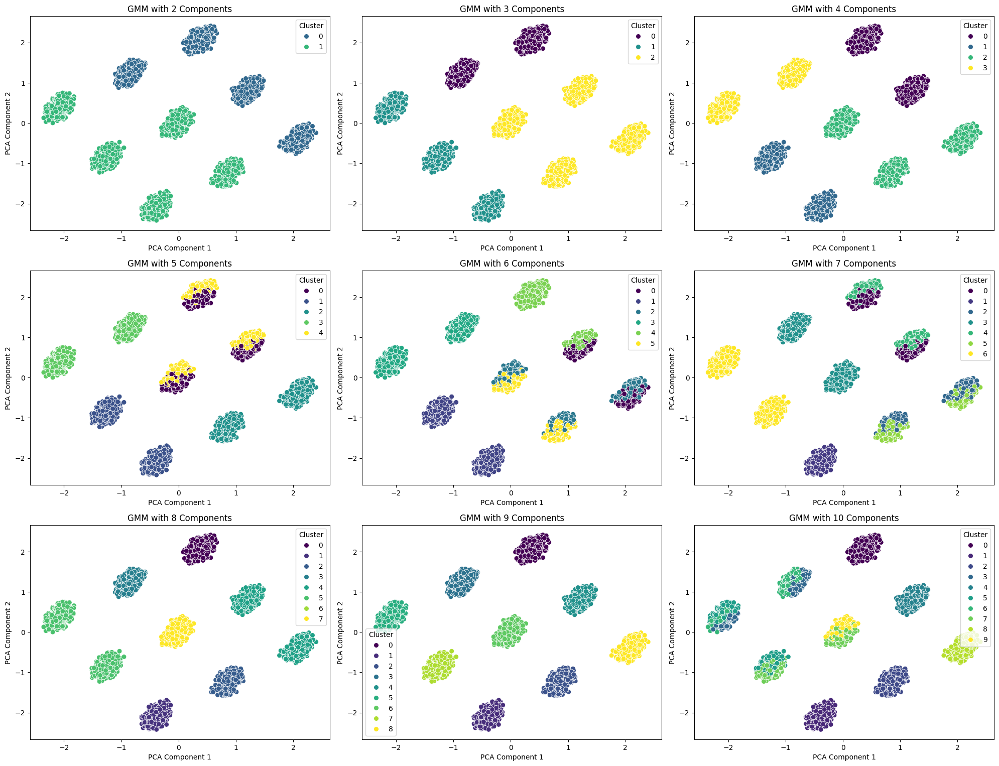

In [39]:
plt.figure(figsize=(20, 20))
for i, k in enumerate(range(2, 10 + 1), start=1):
    # Fit GMM with k components
    gmm = GaussianMixture(n_components=k, random_state=42)
    labels = gmm.fit_predict(X_scaled)
    
    # Create a subplot for each number of components
    plt.subplot(4, 3, i)
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1],
                    hue=labels, palette='viridis', s=50, legend='full')
    plt.title(f"GMM with {k} Components")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.legend(title='Cluster', loc='best')

plt.tight_layout()
plt.show()

In [43]:
# 4. Gaussian Mixture Models
gmm = GaussianMixture(n_components=9, random_state=42)
gmm_labels = gmm.fit_predict(X_scaled)
sil_gmm = silhouette_score(X_scaled, gmm_labels)
df['GMM'] = {'labels': gmm_labels, 'silhouette': sil_gmm}
print("GMM silhouette score:", sil_gmm)


GMM silhouette score: 0.12211849928275428


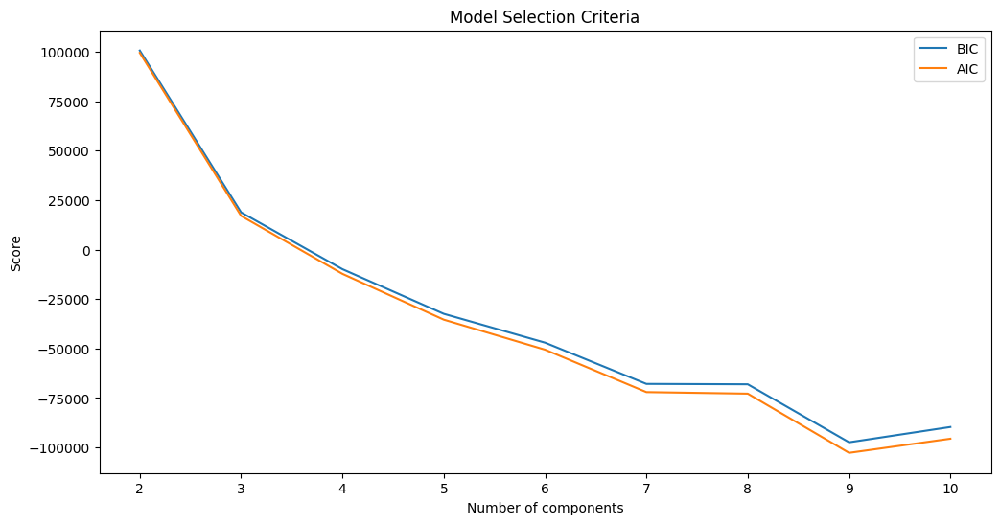


Average probability of points belonging to their assigned cluster:
1.0


In [46]:
# Evaluate different numbers of components
n_components_range = range(2, 11)
bic = []
aic = []

for n_components in n_components_range:
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(X_scaled)
    bic.append(gmm.bic(X_scaled))
    aic.append(gmm.aic(X_scaled))

# Plot evaluation metrics
plt.figure(figsize=(12, 6))
plt.plot(n_components_range, bic, label='BIC')
plt.plot(n_components_range, aic, label='AIC')
plt.xlabel('Number of components')
plt.ylabel('Score')
plt.title('Model Selection Criteria')
plt.legend()
plt.show()

# Get cluster probabilities for best model
best_n = n_components_range[np.argmin(bic)]
best_gmm = GaussianMixture(n_components=best_n, random_state=42)
best_gmm.fit(X_scaled)  # First fit the model
probabilities = best_gmm.predict_proba(X_scaled)  # Then get probabilities

print(f"\nAverage probability of points belonging to their assigned cluster:")
print(np.mean(np.max(probabilities, axis=1)))

    X-axis: Number of components (Gaussian clusters).
    Y-axis: AIC and BIC scores (lower is better).
    AIC (Orange Line): Measures model quality by balancing fit and complexity.
    BIC (Blue Line): Similar to AIC but includes a stronger penalty for model complexity.

Key Observations

    As n_components increases, both AIC and BIC decrease, indicating a better model fit.
    Around n_components = 9, AIC and BIC reach their lowest values, suggesting that 9 clusters might be the optimal choice.
    After n_components = 9, scores start increasing, meaning additional clusters may lead to overfitting.

Thus, the ideal number of clusters for this dataset is likely around 9, as it balances model fit and complexity best.

### **AIC (Akaike Information Criterion) and BIC (Bayesian Information Criterion) in GMM**  
Both **AIC** and **BIC** are model selection criteria used to determine the optimal number of clusters (**n_components**) in a Gaussian Mixture Model (GMM). They help balance the trade-off between **model complexity** and **goodness of fit**.

---

## **1. Akaike Information Criterion (AIC)**
**Formula:**  
\[
AIC = -2 \log L + 2k
\]  
Where:  
- \( L \) = Maximum likelihood of the model (how well it fits the data)  
- \( k \) = Number of parameters in the model (depends on n_components, means, covariances, and weights)  

### **How AIC Works:**
- It **penalizes models with more parameters** to avoid overfitting.
- The **lower the AIC, the better the model**.
- AIC prefers models that **fit well** while being relatively simple.

---

## **2. Bayesian Information Criterion (BIC)**
**Formula:**  
\[
BIC = -2 \log L + k \log N
\]  
Where:  
- \( N \) = Number of data points  
- \( k \) = Number of parameters  
- \( L \) = Maximum likelihood  

### **How BIC Works:**
- Similar to AIC, but **penalizes complex models more heavily**, since it includes \( \log N \).
- **Lower BIC means a better model**.
- BIC tends to favor **simpler models** compared to AIC.

---

## **Key Differences Between AIC and BIC**
| Criteria | Formula | Penalization | Tendency |
|----------|--------|--------------|----------|
| **AIC** | \(-2 \log L + 2k\) | Penalizes model complexity **less** | May choose a slightly more complex model |
| **BIC** | \(-2 \log L + k \log N\) | Penalizes model complexity **more** | Prefers **simpler models** when data size is large |

---

### **How They Work in Your Graph**
- The **x-axis** (Number of components) represents the number of Gaussians (**n_components**) in GMM.
- The **y-axis** (Score) shows AIC and BIC values.
- As **n_components increases**, AIC and BIC **decrease initially**, meaning the fit improves.
- But at some point (around **n = 9** in your graph), they start increasing again, meaning extra components add **unnecessary complexity**.

**Takeaway:**  
- **Choose the "elbow point" where AIC/BIC are lowest** → Likely the best n_components.
- If **AIC and BIC disagree**, BIC is usually more conservative and prefers a **simpler model**.

Would you like to analyze specific values from your graph? 🚀

Cluster Analysis:
--------------------------------------------------

Cluster 0 (547 samples, 10.9%)
------------------------------
Most distinctive features:
Account_Balance: 5197.41
Rewards_Points: 4892.46
Transaction_Amount: 2441.44
Credit_Limit: 5589.00
Credit_Card_Balance: 2521.05

Cluster 1 (524 samples, 10.5%)
------------------------------
Most distinctive features:
Credit_Limit: 5364.08
Account_Balance: 4992.24
Rewards_Points: 5020.74
Account_Age_Days: 4363.51
Transaction_Amount: 2494.74

Cluster 2 (546 samples, 10.9%)
------------------------------
Most distinctive features:
Transaction_Amount: 2696.55
Account_Age_Days: 4286.16
Account_Balance: 5116.09
Credit_Limit: 5574.19
Rewards_Points: 4961.69

Cluster 3 (551 samples, 11.0%)
------------------------------
Most distinctive features:
Credit_Limit: 5416.96
Transaction_Amount: 2616.86
Rewards_Points: 4884.93
Account_Balance: 5018.77
Account_Age_Days: 4360.36

Cluster 4 (544 samples, 10.9%)
------------------------------
Most 

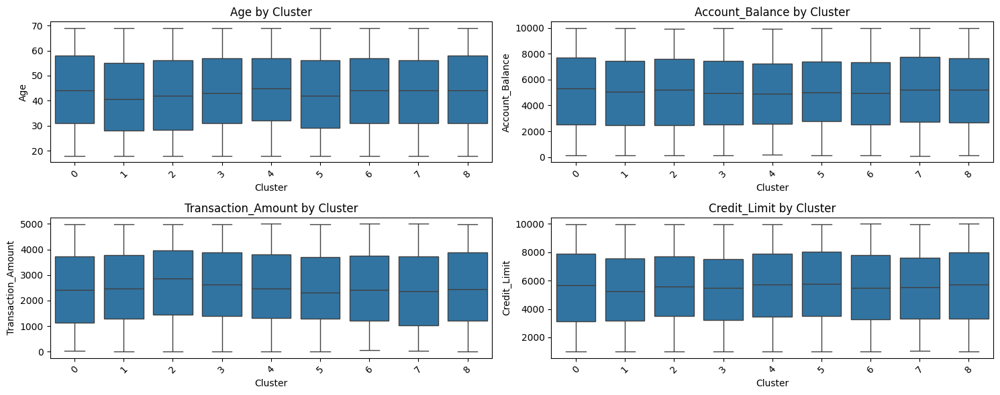

In [48]:
# Get the best number of components from BIC
best_n = n_components_range[np.argmin(bic)]
best_gmm = GaussianMixture(n_components=best_n, random_state=42)
cluster_labels = best_gmm.fit_predict(X_scaled)

# Create a DataFrame with original features and cluster labels
cluster_df = X.copy()
cluster_df['Cluster'] = cluster_labels

# Calculate cluster statistics
print("Cluster Analysis:")
print("-" * 50)
for cluster in range(best_n):
    cluster_data = cluster_df[cluster_df['Cluster'] == cluster]
    cluster_size = len(cluster_data)
    cluster_percentage = (cluster_size / len(cluster_df)) * 100
    
    print(f"\nCluster {cluster} ({cluster_size} samples, {cluster_percentage:.1f}%)")
    print("-" * 30)
    
    # Calculate mean values for each feature
    means = cluster_data.mean()
    
    # Sort features by absolute difference from overall mean
    overall_means = cluster_df.mean()
    feature_importance = abs(means - overall_means)
    top_features = feature_importance.sort_values(ascending=False)[:5]
    
    print("Most distinctive features:")
    for feature in top_features.index:
        print(f"{feature}: {means[feature]:.2f}")

# Visualize feature distributions across clusters
plt.figure(figsize=(15, 6))
for i, feature in enumerate(X.columns[:4]):  # Show first 4 features
    plt.subplot(2, 2, i+1)
    sns.boxplot(data=cluster_df, x='Cluster', y=feature)
    plt.title(f'{feature} by Cluster')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Cluster Profiles:
                     Cluster_0  Cluster_1  Cluster_2  Cluster_3  Cluster_4  \
Size                    547.00     524.00     546.00     551.00     544.00   
Size_Percentage          10.94      10.48      10.92      11.02      10.88   
Avg_Account_Balance    5197.41    4992.24    5116.09    5018.77    4958.64   
Avg_Transaction        2441.44    2494.74    2696.55    2616.86    2517.66   
Avg_Credit_Limit       5589.00    5364.08    5574.19    5416.96    5660.18   
Avg_Probability           1.00       1.00       1.00       1.00       1.00   

                     Cluster_5  Cluster_6  Cluster_7  Cluster_8  
Size                    536.00     613.00     570.00     569.00  
Size_Percentage          10.72      12.26      11.40      11.38  
Avg_Account_Balance    4979.40    4944.07    5191.89    5147.03  
Avg_Transaction        2444.11    2465.80    2392.15    2514.74  
Avg_Credit_Limit       5686.42    5521.99    5477.75    5649.57  
Avg_Probability           1.00       1.

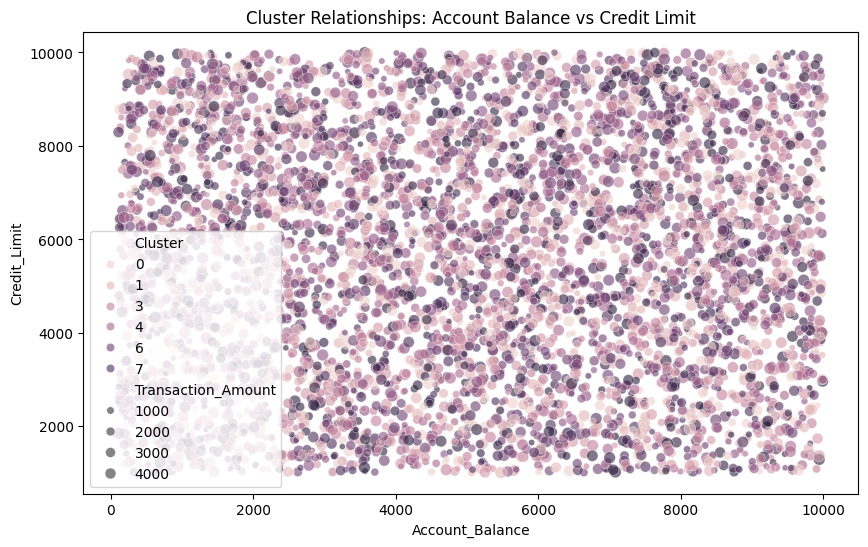

In [50]:
# Add cluster probability analysis
cluster_df['Highest_Prob'] = np.max(best_gmm.predict_proba(X_scaled), axis=1)

# Calculate cluster profiles
profiles = pd.DataFrame()
for cluster in range(best_n):
    cluster_mask = cluster_df['Cluster'] == cluster
    
    # Calculate key metrics
    profile = {
        'Size': cluster_mask.sum(),
        'Size_Percentage': (cluster_mask.sum() / len(cluster_df) * 100),
        'Avg_Account_Balance': cluster_df[cluster_mask]['Account_Balance'].mean(),
        'Avg_Transaction': cluster_df[cluster_mask]['Transaction_Amount'].mean(),
        'Avg_Credit_Limit': cluster_df[cluster_mask]['Credit_Limit'].mean(),
        'Avg_Probability': cluster_df[cluster_mask]['Highest_Prob'].mean()
    }
    profiles[f'Cluster_{cluster}'] = pd.Series(profile)

print("Cluster Profiles:")
print(profiles.round(2))

# Visualize cluster relationships
plt.figure(figsize=(10, 6))
sns.scatterplot(data=cluster_df, 
                x='Account_Balance', 
                y='Credit_Limit',
                hue='Cluster',
                size='Transaction_Amount',
                alpha=0.6)
plt.title('Cluster Relationships: Account Balance vs Credit Limit')
plt.show()

Let me break down this cluster profile data:

1. **Cluster Distribution**:
   - There are 9 clusters (Cluster_0 to Cluster_8)
   - Very even distribution of customers across clusters:
     - Smallest: Cluster_1 (524 customers, 10.48%)
     - Largest: Cluster_6 (613 customers, 12.26%)
     - Most clusters have around 540-570 customers

2. **Financial Metrics**:
   - **Account Balances**:
     - Highest: Cluster_0 (~$5,197)
     - Lowest: Cluster_6 (~$4,944)
     - Most clusters average between $4,900-$5,200

   - **Transaction Amounts**:
     - Highest: Cluster_2 (~$2,697)
     - Lowest: Cluster_7 (~$2,392)
     - Most clusters average between $2,400-$2,600

   - **Credit Limits**:
     - Highest: Cluster_5 (~$5,686)
     - Lowest: Cluster_1 (~$5,364)
     - Most clusters average between $5,400-$5,700

3. **Cluster Confidence**:
   - Avg_Probability is 1.00 for all clusters
   - This indicates very high confidence in cluster assignments
   - Each data point strongly belongs to its assigned cluster

The data shows that while there are distinct clusters, the differences between them are subtle, suggesting nuanced customer segments with overlapping characteristics rather than dramatically different customer groups.

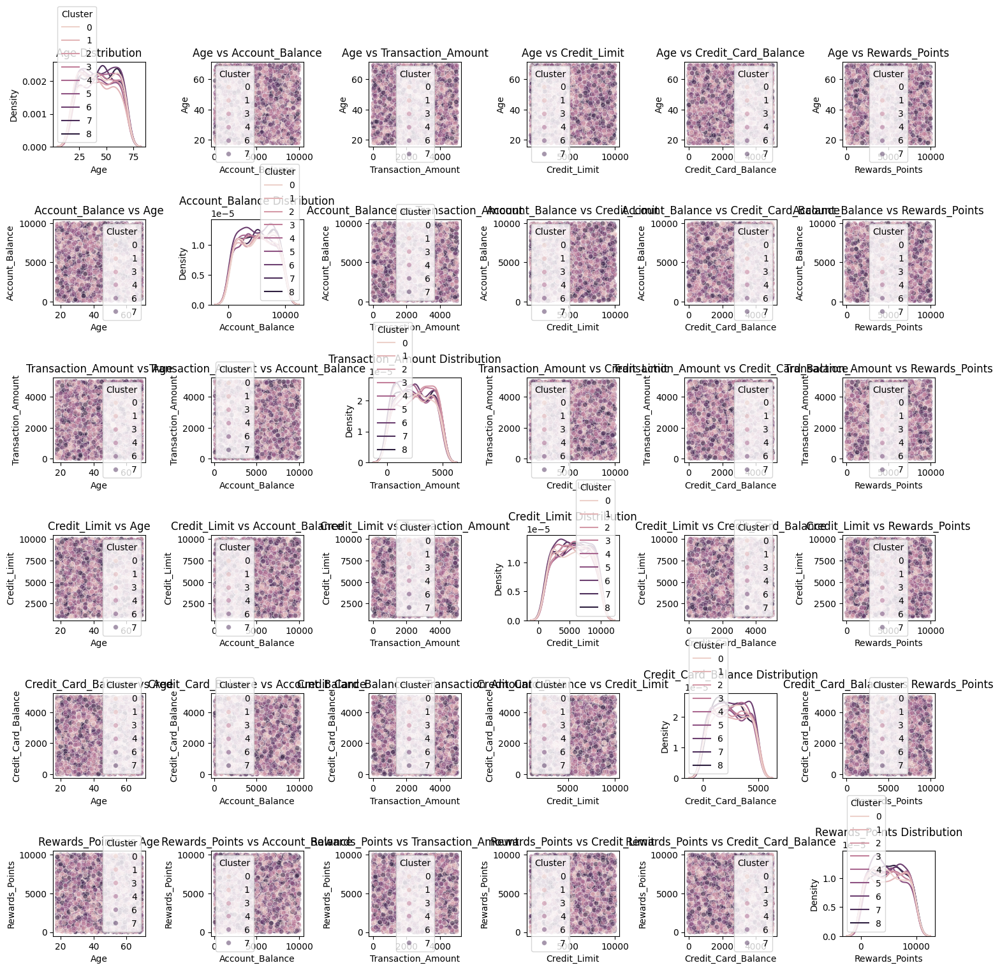

In [52]:
# Create a more informative scatter plot matrix
plt.figure(figsize=(15, 15))
features_to_plot = ['Age', 'Account_Balance', 'Transaction_Amount', 
                    'Credit_Limit', 'Credit_Card_Balance', 'Rewards_Points']

for i, feature1 in enumerate(features_to_plot):
    for j, feature2 in enumerate(features_to_plot):
        plt.subplot(len(features_to_plot), len(features_to_plot), i*len(features_to_plot) + j + 1)
        if i != j:
            sns.scatterplot(data=cluster_df, x=feature2, y=feature1, 
                          hue='Cluster', alpha=0.5, s=30)
            plt.title(f'{feature1} vs {feature2}')
        else:
            sns.kdeplot(data=cluster_df, x=feature1, hue='Cluster')
            plt.title(f'{feature1} Distribution')
plt.tight_layout()
plt.show()

In [54]:
cluster_df

,Age,Account_Balance,Transaction_Amount,Credit_Limit,Credit_Card_Balance,Rewards_Points,Account_Age_Days,Gender_Male,Gender_Other,Account_Type_Savings,Loan_Status_Closed,Loan_Status_Rejected,Cluster,Highest_Prob
0,45,1313.38,1457.61,1737.88,4524.32,8142,6176,True,False,False,False,True,5,1.0
1,47,5988.46,1660.99,1799.36,856.70,4306,6175,False,False,False,False,False,6,1.0
2,25,8277.88,839.91,6112.96,3242.36,4842,2723,False,False,False,True,False,4,1.0
3,52,7487.21,4908.89,2069.41,4329.17,9463,5663,False,True,True,False,False,2,1.0
4,68,6993.55,589.07,2765.30,25.72,2209,671,False,True,True,False,False,2,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,21,5564.12,1612.91,4347.17,2017.13,7530,1219,False,True,True,False,True,1,1.0
4996,27,2625.13,2493.45,8379.59,853.33,8796,4324,False,False,True,True,False,4,1.0
4997,45,2732.76,418.38,8208.84,228.49,9966,4115,False,False,False,False,True,7,1.0
4998,58,3006.01,3160.96,3083.35,325.37,538,8403,False,False,False,False,True,7,1.0


In [53]:
# Calculate z-scores for each feature in each cluster
cluster_characteristics = pd.DataFrame()

for cluster in range(best_n):
    cluster_mask = cluster_df['Cluster'] == cluster
    cluster_means = cluster_df[cluster_mask].mean()
    overall_means = cluster_df.mean()
    overall_stds = cluster_df.std()
    
    # Calculate z-scores
    z_scores = (cluster_means - overall_means) / overall_stds
    
    # Get top distinguishing features
    top_features = z_scores.abs().sort_values(ascending=False)[:5]
    
    print(f"\nCluster {cluster} Key Characteristics:")
    print("-" * 30)
    for feature in top_features.index:
        direction = "higher" if z_scores[feature] > 0 else "lower"
        print(f"{feature}: {abs(z_scores[feature]):.2f} standard deviations {direction} than average")


Cluster 0 Key Characteristics:
------------------------------
Cluster: 1.57 standard deviations lower than average
Gender_Male: 1.44 standard deviations higher than average
Loan_Status_Closed: 1.42 standard deviations higher than average
Gender_Other: 0.70 standard deviations lower than average
Loan_Status_Rejected: 0.70 standard deviations lower than average

Cluster 1 Key Characteristics:
------------------------------
Loan_Status_Rejected: 1.44 standard deviations higher than average
Gender_Other: 1.43 standard deviations higher than average
Cluster: 1.19 standard deviations lower than average
Loan_Status_Closed: 0.70 standard deviations lower than average
Gender_Male: 0.70 standard deviations lower than average

Cluster 2 Key Characteristics:
------------------------------
Gender_Other: 1.43 standard deviations higher than average
Cluster: 0.80 standard deviations lower than average
Loan_Status_Closed: 0.70 standard deviations lower than average
Gender_Male: 0.70 standard deviatio

- Gender-Based Segments :

- Cluster 0 & 3: High male representation (1.44 SD higher)
- Cluster 1, 2, & 8: High 'Other' gender representation (1.43 SD higher)
- This suggests distinct customer segments based on gender demographics
- Loan Status Patterns :

- Clusters 0, 4, & 8: Higher proportion of closed loans (1.42 SD higher)
- Clusters 1, 5, & 7: Higher proportion of rejected loans (1.44 SD higher)
- Shows clear segmentation in loan outcomes
- Cluster Size and Distribution :

- Clusters 7 & 8: Significantly larger (1.13-1.52 SD higher)
- Clusters 0, 1, & 2: Significantly smaller (0.80-1.57 SD lower)
- Indicates uneven distribution of customers across segments